<a id="section-top"></a>

* [Introduction](#section-zero)
* [Data Preparation](#section-one)
* [Countries, Flags and some Utils](#section-two)
* [Plotting](#section-three)
* [Animation](#section-four)
* [Conclusion](#section-five)

<a id="section-zero"></a>
# 0. Introduction

In this notebook, I will create bar chart race, or animated bar plot from scratch.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.ticker as ticker
from matplotlib.patches import Patch
from matplotlib.offsetbox import OffsetImage,AnnotationBbox
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

from PIL import Image
import urllib
import pycountry

<a id="section-one"></a>
# 1. Data Preparation

In [2]:
vaccination_df = pd.read_csv("../input/covid-world-vaccination-progress/country_vaccinations.csv")
vaccination_df.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://app.powerbi.com/view?r=eyJrIjoiYTkyM2V...
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://app.powerbi.com/view?r=eyJrIjoiYTkyM2V...
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://app.powerbi.com/view?r=eyJrIjoiYTkyM2V...
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://app.powerbi.com/view?r=eyJrIjoiYTkyM2V...
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://app.powerbi.com/view?r=eyJrIjoiYTkyM2V...


In [3]:
df = vaccination_df[["date", "country", "daily_vaccinations"]]
df.head()

,date,country,daily_vaccinations
0,2021-02-22,Afghanistan,NaN
1,2021-02-23,Afghanistan,1367.0
2,2021-02-24,Afghanistan,1367.0
3,2021-02-25,Afghanistan,1367.0
4,2021-02-26,Afghanistan,1367.0


In [4]:
df.loc[:, "TotalVaccination"] = df.groupby("country")["daily_vaccinations"].cumsum()
df.head()

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value


,date,country,daily_vaccinations,TotalVaccination
0,2021-02-22,Afghanistan,NaN,NaN
1,2021-02-23,Afghanistan,1367.0,1367.0
2,2021-02-24,Afghanistan,1367.0,2734.0
3,2021-02-25,Afghanistan,1367.0,4101.0
4,2021-02-26,Afghanistan,1367.0,5468.0


In [5]:
pivot = df.pivot(index = "date", columns = "country", values = "TotalVaccination")
pivot.tail()

country,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wales,Wallis and Futuna,Yemen,Zambia,Zimbabwe
date,,,,,,,,,,,,,,,,,,,,,
2021-09-26,NaN,1683506.0,NaN,NaN,3002212.0,NaN,90884.0,49993799.0,390869.0,133368.0,...,6141127.0,18960010.0,NaN,14606337.0,36995634.0,4588051.0,9813.0,341599.0,675579.0,5154354.0
2021-09-27,NaN,1691726.0,NaN,NaN,NaN,NaN,91919.0,50264154.0,NaN,133518.0,...,6162401.0,19162622.0,NaN,14882561.0,37727233.0,4589948.0,9845.0,343815.0,682073.0,5185636.0
2021-09-28,NaN,1700070.0,NaN,NaN,NaN,NaN,92949.0,50524415.0,NaN,133634.0,...,6183255.0,19368680.0,NaN,NaN,38509690.0,4591737.0,9875.0,NaN,689188.0,5215105.0
2021-09-29,NaN,1708421.0,NaN,NaN,NaN,NaN,NaN,50770059.0,NaN,133769.0,...,6203297.0,NaN,NaN,NaN,NaN,4593411.0,NaN,NaN,696952.0,5243254.0
2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51013101.0,NaN,133889.0,...,6222046.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5270299.0


In [6]:
pivot.index = pd.to_datetime(pivot.index)

expanded_df = pivot.asfreq("12H")
expanded_df.tail()

country,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wales,Wallis and Futuna,Yemen,Zambia,Zimbabwe
date,,,,,,,,,,,,,,,,,,,,,
2021-09-28 00:00:00,NaN,1700070.0,NaN,NaN,NaN,NaN,92949.0,50524415.0,NaN,133634.0,...,6183255.0,19368680.0,NaN,NaN,38509690.0,4591737.0,9875.0,NaN,689188.0,5215105.0
2021-09-28 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-29 00:00:00,NaN,1708421.0,NaN,NaN,NaN,NaN,NaN,50770059.0,NaN,133769.0,...,6203297.0,NaN,NaN,NaN,NaN,4593411.0,NaN,NaN,696952.0,5243254.0
2021-09-29 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51013101.0,NaN,133889.0,...,6222046.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5270299.0


In [7]:
rank_df = expanded_df.rank(axis = 1, method = "first", ascending = False)

expanded_df = expanded_df.interpolate()
rank_df = rank_df.interpolate()

Here is the final form of our data.

In [8]:
display(expanded_df.tail())

display(rank_df.tail())

country,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wales,Wallis and Futuna,Yemen,Zambia,Zimbabwe
date,,,,,,,,,,,,,,,,,,,,,
2021-09-28 00:00:00,2921017.0,1700070.0,13143703.0,94622.0,3002212.0,18999.0,92949.0,50524415.0,390869.0,133634.0,...,6183255.0,19368680.0,54756.0,14882561.0,38509690.0,4591737.0,9875.0,343815.0,689188.0,5215105.0
2021-09-28 12:00:00,2921017.0,1704245.5,13143703.0,94622.0,3002212.0,18999.0,92949.0,50647237.0,390869.0,133701.5,...,6193276.0,19368680.0,54756.0,14882561.0,38509690.0,4592574.0,9875.0,343815.0,693070.0,5229179.5
2021-09-29 00:00:00,2921017.0,1708421.0,13143703.0,94622.0,3002212.0,18999.0,92949.0,50770059.0,390869.0,133769.0,...,6203297.0,19368680.0,54756.0,14882561.0,38509690.0,4593411.0,9875.0,343815.0,696952.0,5243254.0
2021-09-29 12:00:00,2921017.0,1708421.0,13143703.0,94622.0,3002212.0,18999.0,92949.0,50891580.0,390869.0,133829.0,...,6212671.5,19368680.0,54756.0,14882561.0,38509690.0,4593411.0,9875.0,343815.0,696952.0,5256776.5
2021-09-30 00:00:00,2921017.0,1708421.0,13143703.0,94622.0,3002212.0,18999.0,92949.0,51013101.0,390869.0,133889.0,...,6222046.0,19368680.0,54756.0,14882561.0,38509690.0,4593411.0,9875.0,343815.0,696952.0,5270299.0


country,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wales,Wallis and Futuna,Yemen,Zambia,Zimbabwe
date,,,,,,,,,,,,,,,,,,,,,
2021-09-28 00:00:00,93.0,88.0,48.0,178.0,88.0,179.0,129.0,19.0,131.0,125.0,...,66.0,34.0,181.0,44.0,25.0,73.0,138.0,126.0,104.0,67.0
2021-09-28 12:00:00,93.0,83.0,48.0,178.0,88.0,179.0,129.0,19.0,131.0,114.5,...,62.0,34.0,181.0,44.0,25.0,68.5,138.0,126.0,97.0,63.0
2021-09-29 00:00:00,93.0,78.0,48.0,178.0,88.0,179.0,129.0,19.0,131.0,104.0,...,58.0,34.0,181.0,44.0,25.0,64.0,138.0,126.0,90.0,59.0
2021-09-29 12:00:00,93.0,78.0,48.0,178.0,88.0,179.0,129.0,16.5,131.0,87.0,...,48.0,34.0,181.0,44.0,25.0,64.0,138.0,126.0,90.0,49.0
2021-09-30 00:00:00,93.0,78.0,48.0,178.0,88.0,179.0,129.0,14.0,131.0,70.0,...,38.0,34.0,181.0,44.0,25.0,64.0,138.0,126.0,90.0,39.0


[take me to the top](#section-top)

<a id="section-two"></a>

# 2. Countries, Flags and some Utils

In [9]:
countries = pd.read_csv("../input/countries-iso-codes-continent-flags-url/countries_continents_codes_flags_url.csv")
countries.head()

,country,images_file,image_url,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,Flag_of_Afghanistan.svg,https://upload.wikimedia.org/wikipedia/commons...,AF,AFG,4.0,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Albania,Flag_of_Albania.svg,https://upload.wikimedia.org/wikipedia/commons...,AL,ALB,8.0,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
2,Algeria,Flag_of_Algeria.svg,https://upload.wikimedia.org/wikipedia/commons...,DZ,DZA,12.0,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
3,Andorra,Flag_of_Andorra.svg,https://upload.wikimedia.org/wikipedia/commons...,AD,AND,20.0,ISO 3166-2:AD,Europe,Southern Europe,NaN,150.0,39.0,NaN
4,Angola,Flag_of_Angola.svg,https://upload.wikimedia.org/wikipedia/commons...,AO,AGO,24.0,ISO 3166-2:AO,Africa,Sub-Saharan Africa,Middle Africa,2.0,202.0,17.0


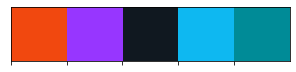

In [10]:
colors_dict = {
    "Africa": "#F1480F", 
    "Americas": "#9736FF", 
    "Asia": "#101820", 
    "Europe": "#0EB8F1", 
    "Oceania": "#008B97"
}

sns.palplot(["#F1480F", "#9736FF", "#101820", "#0EB8F1", "#008B97"])

In [11]:
continent_dict = dict(zip(countries.country, countries.region))

continent_dict["England"] = "Europe"
continent_dict["Scotland"] = "Europe"
continent_dict["Northern Ireland"] = "Europe"
continent_dict["Wales"] = "Europe"
continent_dict["Czechia"] = "Europe"

In [12]:
countries = {}

for country in expanded_df.columns:    
    try:
        countries[country] = pycountry.countries.search_fuzzy(country)[0].alpha_2
    except:
        print(country)

Bonaire Sint Eustatius and Saba
Cape Verde
Democratic Republic of Congo
Faeroe Islands
Laos
Northern Cyprus
South Korea


In [13]:
countries["Bonaire Sint Eustatius and Saba"] = "BQ"
countries["Cape Verde"] = "CV"
countries["Democratic Republic of Congo"] = "CD"
countries["Faeroe Islands"] = "FO"
countries["Laos"] = "LA"
countries["Northern Cyprus"] = "CY"
countries["South Korea"] = "KR"

In [14]:
for (key, item) in countries.items():
    if item == "GB":
        print(key)

England
Northern Ireland
Scotland
United Kingdom
Wales


In [15]:
countries["England"] = "GB-ENG"
countries["Northern Ireland"] = "GB-NIR"
countries["Scotland"] = "GB-SCT"
countries["Wales"] = "GB-WLS"

In [16]:
img_dict = {}

for col in expanded_df.columns:
    img = Image.open(urllib.request.urlopen(f"https://raw.githubusercontent.com/google/region-flags/gh-pages/png/{countries[col]}.png"))
    img_dict[col] = img.convert("RGB")

In [17]:
legend = []

for (continent, color) in colors_dict.items():
    legend.append(
        Patch(facecolor = color, edgecolor = "#101820", alpha = 0.8, label = continent)
    )

I just modified get_bar_info function. You can reach github of bar_chart_race package from below.

https://github.com/dexplo/bar_chart_race/blob/master/bar_chart_race/_bar_chart_race.py



In [18]:
n_bars = 20

def get_bar_info(time):
    
    bar_location = rank_df.iloc[time].values
    top_filt = (bar_location > 0) & (bar_location < n_bars + 1)
    bar_location = bar_location[top_filt]
    bar_length = expanded_df.iloc[time].values[top_filt]
    cols = expanded_df.columns[top_filt]
    colors = [colors_dict[continent_dict[x]] for x in cols]
    
    return bar_location, bar_length, cols, colors

[take me to the top](#section-top)

<a id="section-three"></a>
# 3. Plotting

In [19]:
def update(time):
        
    bar_location, bar_length, cols, colors = get_bar_info(time)
    
    ax.clear()
    ax.set_facecolor("#E5E5E5")
    ax.tick_params(labelsize = 6)
    ax.grid(True, axis = "x", color = "#A4A4A4", linestyle = "--", alpha = 0.2)
    ax.set_axisbelow(True)
    [spine.set_visible(False) for spine in ax.spines.values()]
    ax.set_ylim(0.2, 20.8)
    
    ticks = ticker.FuncFormatter(lambda x, pos: "{0:g}".format(x / 1e6))
    ax.xaxis.set_major_formatter(ticks)

    ax.barh(
        y = bar_location,
        width = bar_length,
        tick_label = cols,
        height = 0.8,
        color = colors,
        edgecolor = "#101820",
        alpha = 0.8
    )
        
    for i, col in enumerate(cols):
        
        img = img_dict[col]
        img = img.resize((100, 100))
        im = OffsetImage(img, zoom = 0.1)
        im.image.axes = ax

        ab = AnnotationBbox(
            im,
            (bar_length[i], bar_location[i]), 
            xybox = (-20, 0),
            frameon = False, 
            xycoords = "data",
            boxcoords = "offset points",
            pad = 0)
        
        ax.text(bar_length[i] + max(bar_length) / 100, bar_location[i] + 0.3, "{:,}".format(int(bar_length[i])), size = 5)

        ax.add_artist(ab)

    date = expanded_df.index[time].strftime("%d %B, %Y")
    ax.text(0.95, 0.4, date, transform = ax.transAxes, color = "#101820", size = 22, ha = "right", weight = 800)
    
    total_vaccination = expanded_df.iloc[time].sum()
    ax.text(0.95, 0.3, "Total Vaccination for World:    {:,}".format(int(total_vaccination)), 
            transform = ax.transAxes, color = "#101820", size = 6, ha = "right", weight = 400)
    
    ax.text(1.05, 0, "Millions", transform = ax.transAxes, color = "#101820", size = 5, ha = "right", weight = 400)
    
    ax.legend(handles = legend, bbox_to_anchor=(-0.01, 0.95, 0.33, 0.1), ncol = 5,
              fontsize = 4.5, facecolor = "#E5E5E5", edgecolor = "#E5E5E5")

    ax.set_title("COVID-19 World Vaccination Progress\n")
    ax.text(1.05, 0.1, "kaggle.com/mustafacicek \nlinkedin.com/in/mustafa-cicek/", 
            transform = ax.transAxes, color = "#101820", alpha = 0.2, ha = "right", size = 4)
    ax.invert_yaxis()
    ax.yaxis.set_tick_params(pad = 20)

Let"s look at a sample frame before animate.

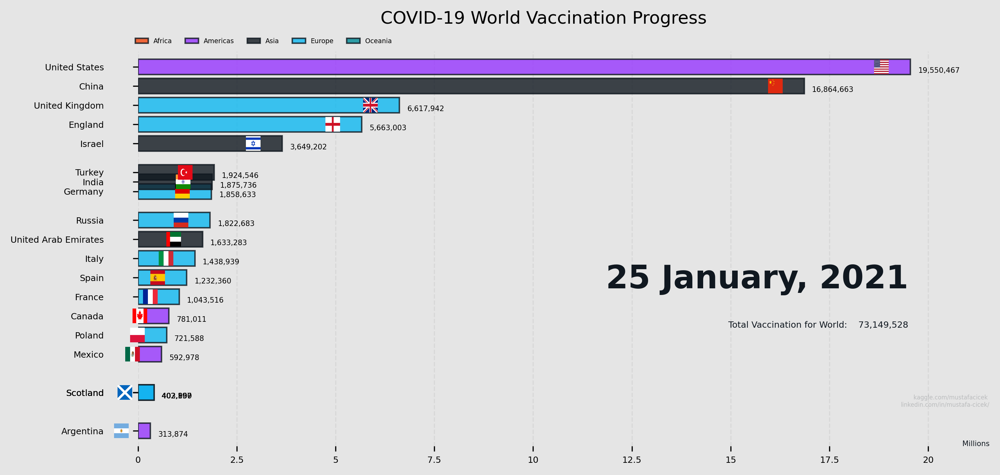

In [20]:
fig, ax = plt.subplots(figsize = (10, 5), dpi = 300, facecolor = "#E5E5E5")

update(111)

[take me to the top](#section-top)

<a id="section-four"></a>
# 4. Animation

In [21]:
fig, ax = plt.subplots(figsize = (10, 5), dpi = 300, facecolor = "#E5E5E5")

plt.close()

animator = FuncAnimation(
    fig, 
    update, 
    frames = range(16, len(expanded_df)), 
    interval = 100, 
    repeat = True, 
    save_count = range(16, len(expanded_df))
)

# HTML(animator.to_html5_video())

In [22]:
video_html = animator.to_html5_video().replace('width="3000"', 'width="800"').replace('height="1500"', 'height="400"')

In [23]:
HTML(video_html)

**Nice**

[take me to the top](#section-top)

<a id="section-five"></a>

# 5. Conclusion

There is a package for creating bar chart races. https://www.dexplo.org/bar_chart_race/tutorial/

**But I prefer creating animations from scratch. You can easily customize your charts.**



You can take a look;

https://swdevnotes.com/python/2020/create-bar-chart-race-1/

https://pratapvardhan.com/blog/bar-chart-race-python-matplotlib/

https://www.dexplo.org/bar_chart_race/tutorial/

[take me to the top](#section-top)